In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, precision_recall_curve, auc
from PIL import Image
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from torch import nn


import torch.hub
import yaml
import os
import shutil
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
import subprocess
import seaborn as sns
import torch
import xml.etree.ElementTree as ET
from collections import Counter
import numpy as np
from tqdm import tqdm


from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import LabelEncoder



In [2]:
import os
import random
import xml.etree.ElementTree as ET
from collections import Counter
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold
import shutil

Common names count: 763
Class Counts: Counter({'Badger_3_Fur_Brown': 299, 'Badger_6_Fur_GreyBrown': 293, 'Badger_4_Fur_Grey': 147, 'Badger_10_Ear_Round': 106, 'Badger_12_Fur_GreyBrown': 81, 'Badger_13_Face_Thin': 77, 'Badger_5_Fur_Grey': 72, 'Badger_7_Tail_LongBrown': 60, 'Badger_8_Ear_Notche': 55, 'Badger_9_Face_LongStripe': 40, 'Badger_14_Ear_Small': 38, 'Badger_11_Tail_Wide': 17, 'Badger_1_Face_Stripe': 16, 'Badger_2_Face_Stripe': 14})


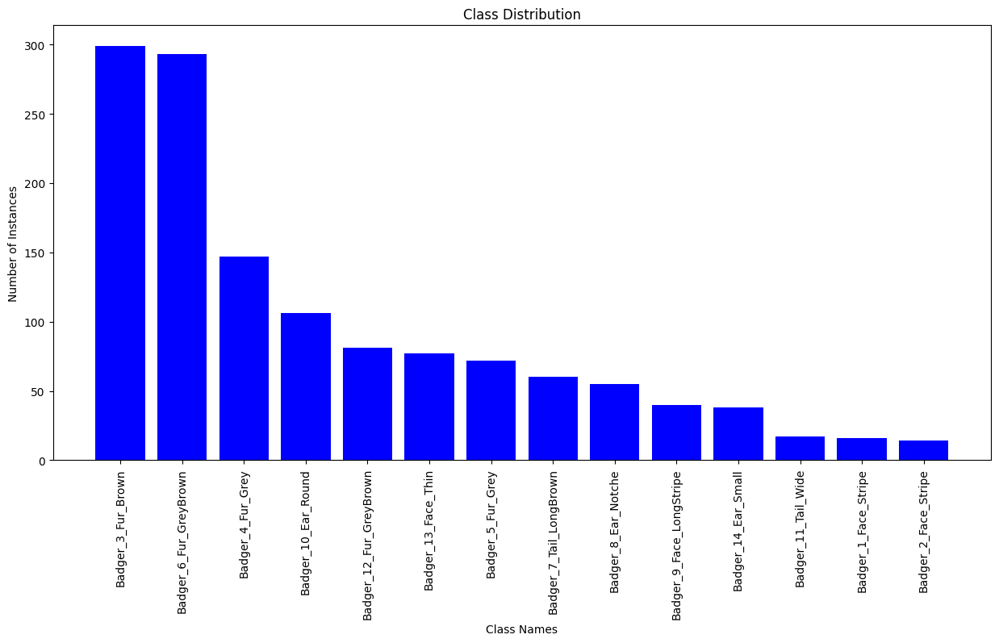

Badger_11_Tail_Wide: 17
Badger_3_Fur_Brown: 299
Badger_4_Fur_Grey: 147
Badger_6_Fur_GreyBrown: 293
Badger_10_Ear_Round: 106
Badger_8_Ear_Notche: 55
Badger_9_Face_LongStripe: 40
Badger_7_Tail_LongBrown: 60
Badger_13_Face_Thin: 77
Badger_12_Fur_GreyBrown: 81
Badger_14_Ear_Small: 38
Badger_5_Fur_Grey: 72
Badger_1_Face_Stripe: 16
Badger_2_Face_Stripe: 14


In [3]:
import os
import shutil
import xml.etree.ElementTree as ET
from collections import Counter
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, KFold
import random

# Paths to the actual image and label 
images_path = '/kaggle/input/project-ai/extracted_frames/extracted_frames/'
labels_path = '/kaggle/input/project-ai/Annotation2/Annotation2/'

# files for images and labels
images = [f for f in os.listdir(images_path) if f.endswith('.jpg')]
labels = [f for f in os.listdir(labels_path) if f.endswith('.xml')]

image_names = [os.path.splitext(f)[0] for f in images]
label_names = [os.path.splitext(f)[0] for f in labels]

# Check common names
common_names = list(set(image_names).intersection(set(label_names)))
print(f"Common names count: {len(common_names)}")

# Parse annotations to get class counts
class_counts = Counter()
annotations = {}

for label_file in labels:
    tree = ET.parse(os.path.join(labels_path, label_file))
    root = tree.getroot()
    for obj in root.iter('object'):
        cls_name = obj.find('name').text
        class_counts[cls_name] += 1
        if cls_name not in annotations:
            annotations[cls_name] = []
        annotations[cls_name].append(label_file)

print("Class Counts:", class_counts)

# Plotting the class distribution
def plot_class_distribution(class_counts, title):
    sorted_classes = sorted(class_counts.items(), key=lambda item: item[1], reverse=True)
    classes, counts = zip(*sorted_classes)
    plt.figure(figsize=(15, 7))
    plt.bar(classes, counts, color='blue')
    plt.xlabel('Class Names')
    plt.ylabel('Number of Instances')
    plt.title(title)
    plt.xticks(rotation=90)
    plt.show()

plot_class_distribution(class_counts, 'Class Distribution')

# Print class counts for reference
for cls, count in class_counts.items():
    print(f'{cls}: {count}')


In [4]:
# extracting Unique Classes
classes = set()

# parse XML files to extract unique class names
for xml_file in os.listdir(labels_path):
    if xml_file.endswith('.xml'):
        tree = ET.parse(os.path.join(labels_path, xml_file))
        root = tree.getroot()
        for obj in root.iter('object'):
            cls_name = obj.find('name').text
            classes.add(cls_name)

# write unique class names to a file
with open('classes.txt', 'w') as f:
    for cls in sorted(classes):
        f.write(f"{cls}\n")

print(f"Found {len(classes)} unique classes.")

# map class names to indices
with open('classes.txt') as f:
    classes = [line.strip() for line in f.readlines()]
class_to_idx = {cls: idx for idx, cls in enumerate(classes)}


Found 14 unique classes.


In [5]:
# Calculate class weights
total_samples = sum(class_counts.values())
class_weights = {cls: total_samples / count for cls, count in class_counts.items()}
max_weight = max(class_weights.values())
class_weights = {cls: weight / max_weight for cls, weight in class_weights.items()}

print("Class Weights:", class_weights)

# Convert class weights to tensor 
class_weights_tensor = torch.tensor([class_weights[cls] for cls in sorted(class_counts)], dtype=torch.float32)
print("Class Weights Tensor:", class_weights_tensor)

Class Weights: {'Badger_11_Tail_Wide': 0.823529411764706, 'Badger_3_Fur_Brown': 0.04682274247491639, 'Badger_4_Fur_Grey': 0.09523809523809523, 'Badger_6_Fur_GreyBrown': 0.0477815699658703, 'Badger_10_Ear_Round': 0.1320754716981132, 'Badger_8_Ear_Notche': 0.2545454545454546, 'Badger_9_Face_LongStripe': 0.35, 'Badger_7_Tail_LongBrown': 0.23333333333333334, 'Badger_13_Face_Thin': 0.18181818181818182, 'Badger_12_Fur_GreyBrown': 0.1728395061728395, 'Badger_14_Ear_Small': 0.368421052631579, 'Badger_5_Fur_Grey': 0.19444444444444445, 'Badger_1_Face_Stripe': 0.875, 'Badger_2_Face_Stripe': 1.0}
Class Weights Tensor: tensor([0.1321, 0.8235, 0.1728, 0.1818, 0.3684, 0.8750, 1.0000, 0.0468, 0.0952,
        0.1944, 0.0478, 0.2333, 0.2545, 0.3500])


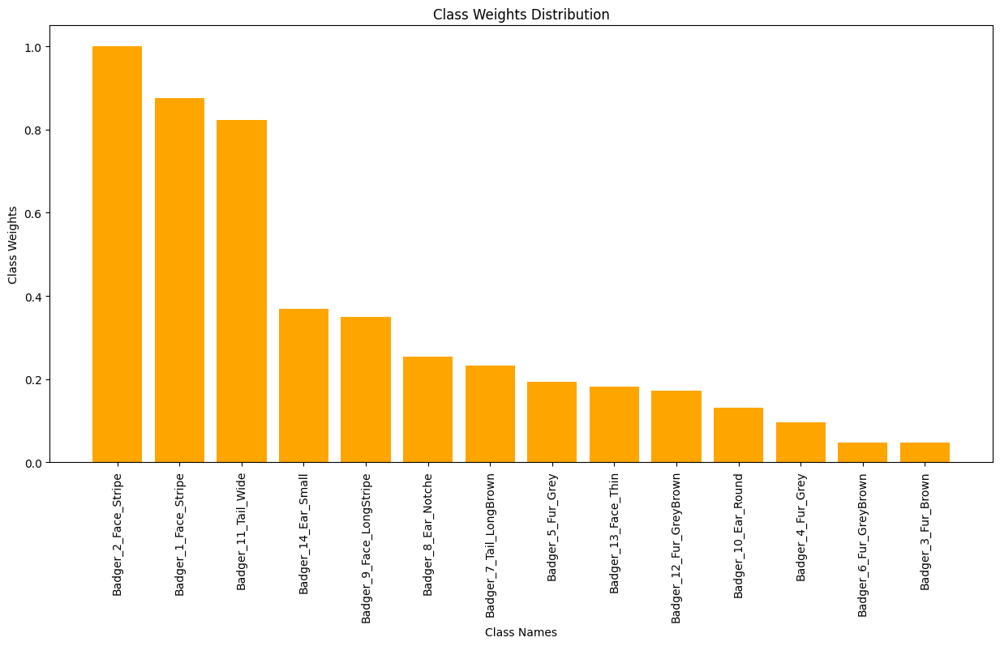

Badger_2_Face_Stripe: 14
Badger_1_Face_Stripe: 16
Badger_11_Tail_Wide: 17
Badger_14_Ear_Small: 38
Badger_9_Face_LongStripe: 40
Badger_8_Ear_Notche: 55
Badger_7_Tail_LongBrown: 60
Badger_5_Fur_Grey: 72
Badger_13_Face_Thin: 77
Badger_12_Fur_GreyBrown: 81
Badger_10_Ear_Round: 106
Badger_4_Fur_Grey: 147
Badger_6_Fur_GreyBrown: 293
Badger_3_Fur_Brown: 299


In [51]:
# Visualization of Class Weights
sorted_classes = sorted(class_weights.items(), key=lambda item: item[1], reverse=True)
classes, weights = zip(*sorted_classes)

plt.figure(figsize=(15, 7))
plt.bar(classes, weights, color='orange')
plt.xlabel('Class Names')
plt.ylabel('Class Weights')
plt.title('Class Weights Distribution')
plt.xticks(rotation=90)
plt.show()


# Print class counts 
for cls in classes:
    print(f'{cls}: {class_counts[cls]}')

In [6]:
import subprocess
import random
import yaml

# convert bounding boxes
def convert(size, box):
    dw = 1. / size[0]
    dh = 1. / size[1]
    x = (box[0] + box[1]) / 2.0
    y = (box[2] + box[3]) / 2.0
    w = box[1] - box[0]
    h = box[3] - box[2]
    return (x * dw, y * dh, w * dw, h * dh)

# check if bounding boxes are within image bounds
def is_within_bounds(box, width, height):
    xmin, xmax, ymin, ymax = box
    if xmin < 0 or xmax > width or ymin < 0 or ymax > height:
        return False
    if xmax <= xmin or ymax <= ymin:
        return False
    return True

# convert XML annotations to YOLO format
def convert_annotation(xml_file, txt_file):
    try:
        tree = ET.parse(xml_file)
        root = tree.getroot()
        size = root.find('size')
        w = int(size.find('width').text)
        h = int(size.find('height').text)

        with open(txt_file, 'w') as out_file:
            for obj in root.iter('object'):
                cls_name = obj.find('name').text
                if cls_name in class_to_idx:
                    cls_id = class_to_idx[cls_name]
                    xmlbox = obj.find('bndbox')
                    b = (float(xmlbox.find('xmin').text), float(xmlbox.find('xmax').text),
                         float(xmlbox.find('ymin').text), float(xmlbox.find('ymax').text))
                    if not is_within_bounds(b, w, h):
                        print(f"Warning: Box {b} in file {xml_file} is out of bounds.")
                        continue
                    bb = convert((w, h), b)
                    out_file.write(f"{cls_id} {' '.join(map(str, bb))}\n")
    except Exception as e:
        print(f"Error processing file {xml_file}: {e}")

In [7]:

import os
import yaml
import shutil
import xml.etree.ElementTree as ET
from sklearn.model_selection import StratifiedKFold, train_test_split
from collections import Counter


# extract the first class label from XML files
def extract_first_label(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    for obj in root.iter('object'):
        return obj.find('name').text  # Return the first label
    return None  # Return None 

# Prepare data for cross-validation
data = []
labels = []

for common_name in common_names:
    xml_path = os.path.join(labels_path, common_name + '.xml')
    img_path = os.path.join(images_path, common_name + '.jpg')
    if os.path.exists(xml_path) and os.path.exists(img_path):
        label = extract_first_label(xml_path)
        if label:  
            data.append((img_path, xml_path))
            labels.append(label)

# Split data into train+val and test sets
train_val_data, test_data, train_val_labels, test_labels = train_test_split(data, labels, test_size=0.2, stratify=labels, random_state=42)

# Create StratifiedKFold object
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Perform cross-validation
for fold, (train_idx, val_idx) in enumerate(kf.split(train_val_data, train_val_labels)):
    os.makedirs(f'fold_{fold}/images/train', exist_ok=True)
    os.makedirs(f'fold_{fold}/labels/train', exist_ok=True)
    os.makedirs(f'fold_{fold}/images/val', exist_ok=True)
    os.makedirs(f'fold_{fold}/labels/val', exist_ok=True)
    os.makedirs(f'fold_{fold}/images/test', exist_ok=True)
    os.makedirs(f'fold_{fold}/labels/test', exist_ok=True)
    
    for idx in train_idx:
        img_path, xml_path = train_val_data[idx]
        shutil.copy(img_path, f'fold_{fold}/images/train/')
        shutil.copy(xml_path, f'fold_{fold}/labels/train/')
        
    for idx in val_idx:
        img_path, xml_path = train_val_data[idx]
        shutil.copy(img_path, f'fold_{fold}/images/val/')
        shutil.copy(xml_path, f'fold_{fold}/labels/val/')
    
    for img_path, xml_path in test_data:
        shutil.copy(img_path, f'fold_{fold}/images/test/')
        shutil.copy(xml_path, f'fold_{fold}/labels/test/')

print("Cross-validation data preparation completed.")


Cross-validation data preparation completed.


In [8]:
# Load unique classes from the file
with open('classes.txt') as f:
    unique_classes = [line.strip() for line in f.readlines()]

def update_yaml(fold):
    yaml_content = f"""
train: /kaggle/working/fold_{fold}/images/train
val: /kaggle/working/fold_{fold}/images/val
test: /kaggle/working/fold_{fold}/images/test

nc: {len(unique_classes)}  # number of classes
names: {unique_classes}
"""
    yaml_path = f'/kaggle/working/fold_{fold}/badger.yaml'
    os.makedirs(os.path.dirname(yaml_path), exist_ok=True)
    with open(yaml_path, 'w') as file:
        file.write(yaml_content)
    print(f"YAML Configuration file for fold {fold} created at {yaml_path}")

# Verify YAML creation and its existence
for fold in range(5):
    update_yaml(fold)
    yaml_path = f'/kaggle/working/fold_{fold}/badger.yaml'
    print(f"YAML file for fold {fold} exists: {os.path.exists(yaml_path)}")

# Convert annotations for train, val, and test sets
for fold in range(5):  # 5 folds
    for phase in ['train', 'val', 'test']:
        xml_dir = f'/kaggle/working/fold_{fold}/labels/{phase}'
        txt_dir = f'/kaggle/working/fold_{fold}/labels_yolo/{phase}'
        os.makedirs(txt_dir, exist_ok=True)
        if os.path.exists(xml_dir):
            for xml_file in os.listdir(xml_dir):
                if xml_file.endswith('.xml'):
                    convert_annotation(os.path.join(xml_dir, xml_file), os.path.join(txt_dir, xml_file.replace('.xml', '.txt')))
        else:
            print(f"Directory {xml_dir} does not exist.")

print("Annotation conversion completed.")



YAML Configuration file for fold 0 created at /kaggle/working/fold_0/badger.yaml
YAML file for fold 0 exists: True
YAML Configuration file for fold 1 created at /kaggle/working/fold_1/badger.yaml
YAML file for fold 1 exists: True
YAML Configuration file for fold 2 created at /kaggle/working/fold_2/badger.yaml
YAML file for fold 2 exists: True
YAML Configuration file for fold 3 created at /kaggle/working/fold_3/badger.yaml
YAML file for fold 3 exists: True
YAML Configuration file for fold 4 created at /kaggle/working/fold_4/badger.yaml
YAML file for fold 4 exists: True
Annotation conversion completed.


In [9]:
def check_labels(path, num_files=5):
    from os import listdir
    from os.path import isfile, join
    files = [f for f in listdir(path) if isfile(join(path, f)) and f.endswith('.txt')]
    for f in files[:num_files]:
        print(f'Contents of {f}:')
        with open(join(path, f), 'r') as file:
            contents = file.read()
            print(contents)
            if contents.strip() == '':
                print("Warning: Empty label file!")

for fold in range(5): 
    check_labels(f'/kaggle/working/fold_{fold}/labels_yolo/train/')

# Create symbolic links using os.symlink
for fold in range(5):  #  5 folds
    for phase in ['train', 'val', 'test']:
        src_dir = f'/kaggle/working/fold_{fold}/labels_yolo/{phase}'
        dst_dir = f'/kaggle/working/fold_{fold}/labels/{phase}'
        os.makedirs(dst_dir, exist_ok=True)
        if os.path.exists(src_dir):
            for file_name in os.listdir(src_dir):
                src_file = os.path.join(src_dir, file_name)
                dst_file = os.path.join(dst_dir, file_name)
                if not os.path.exists(dst_file):
                    os.symlink(src_file, dst_file)
            print(f"{phase.capitalize()} labels fold {fold}: {os.listdir(dst_dir)[:10]}")
        else:
            print(f"Source directory {src_dir} does not exist.")

Contents of bum_pressing_2_frame_1080.txt:
7 0.5765625 0.19351851851851853 0.18229166666666666 0.23703703703703705

Contents of mum_with_cub_frame_840.txt:
7 0.39427083333333335 0.2726851851851852 0.17083333333333334 0.25277777777777777
8 0.6427083333333333 0.11851851851851852 0.12708333333333333 0.19444444444444445

Contents of IMG_0003_frame_1440.txt:
0 0.4049479166666667 0.6425925925925926 0.030729166666666665 0.03333333333333333

Contents of IMG_0071_frame_900.txt:
3 0.3091145833333333 0.2976851851851852 0.0203125 0.058333333333333334

Contents of IMG_0136_frame_1080.txt:
12 0.7518229166666667 0.7268518518518519 0.021354166666666667 0.04259259259259259
13 0.34296875 0.7990740740740742 0.06197916666666667 0.12222222222222223
12 0.77890625 0.700462962962963 0.022395833333333334 0.036111111111111115

Contents of bum_pressing_2_frame_1080.txt:
7 0.5765625 0.19351851851851853 0.18229166666666666 0.23703703703703705

Contents of IMG_0003_frame_1440.txt:
0 0.4049479166666667 0.64259259259

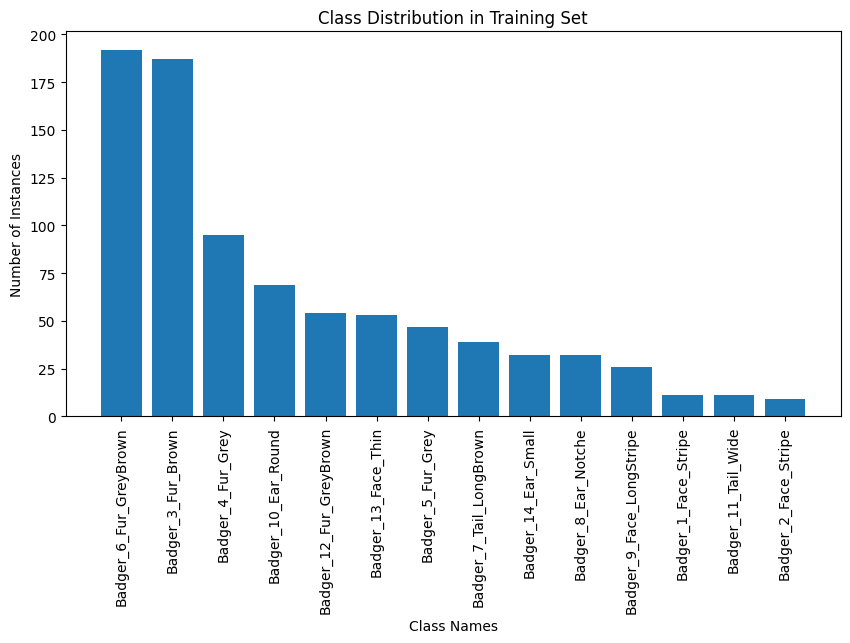

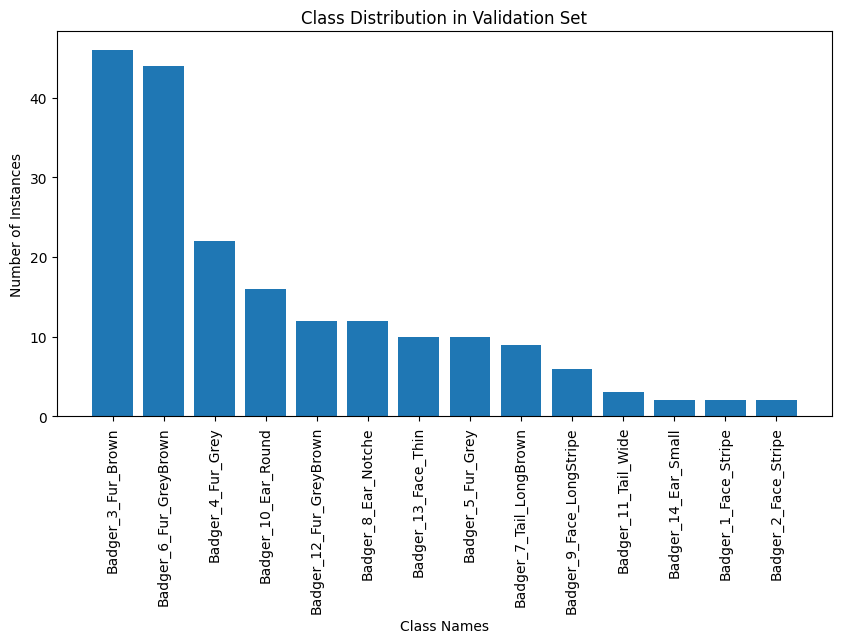

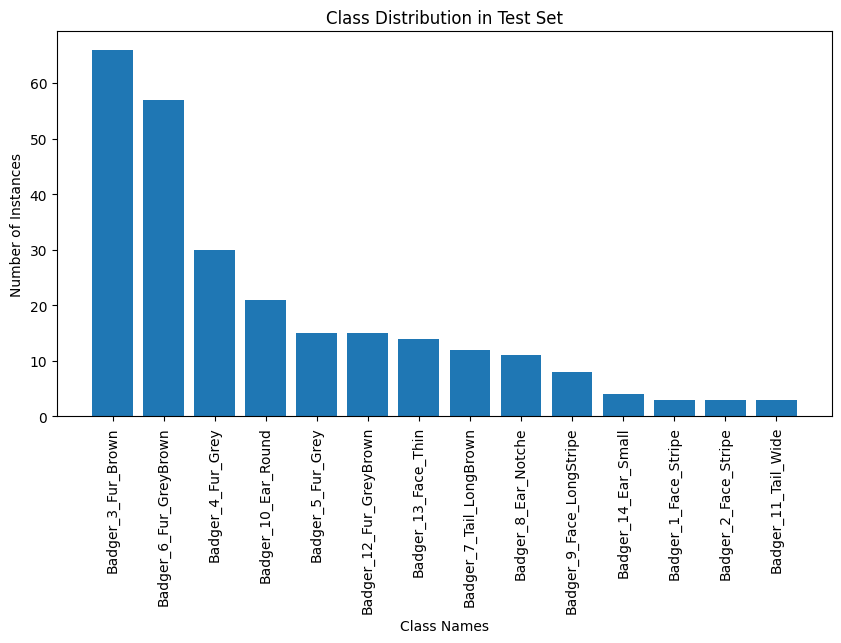

In [47]:
import os
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
from collections import Counter

# Paths to the annotation directories
train_labels_path = '/kaggle/working/fold_4/labels/train'
val_labels_path = '/kaggle/working/fold_4/labels/val'
test_labels_path = '/kaggle/working/fold_4/labels/test'

#parse XML files and count instances of each class
def count_classes(labels_path):
    class_counts = Counter()
    for filename in os.listdir(labels_path):
        if filename.endswith('.xml'):
            tree = ET.parse(os.path.join(labels_path, filename))
            root = tree.getroot()
            for obj in root.iter('object'):
                class_name = obj.find('name').text
                class_counts[class_name] += 1
    return class_counts

# Count classes in each set
train_counts = count_classes(train_labels_path)
val_counts = count_classes(val_labels_path)
test_counts = count_classes(test_labels_path)

# Plot class distributions
def plot_class_distribution(counts, title):
    classes, counts = zip(*sorted(counts.items(), key=lambda item: item[1], reverse=True))
    plt.figure(figsize=(10, 5))
    plt.bar(classes, counts)
    plt.xlabel('Class Names')
    plt.ylabel('Number of Instances')
    plt.title(title)
    plt.xticks(rotation=90)
    plt.show()

plot_class_distribution(train_counts, 'Class Distribution in Training Set')
plot_class_distribution(val_counts, 'Class Distribution in Validation Set')
plot_class_distribution(test_counts, 'Class Distribution in Test Set')

In [10]:
# Initial hyperparameters settings
initial_hyp = {
    'lr0': 0.001,  # initial learning rate
    'lrf': 0.01,   # final OneCycleLR learning rate
    'momentum': 0.937,  # SGD momentum
    'weight_decay': 0.0005,  # optimizer weight decay
    'warmup_epochs': 3.0,  # warmup epochs
    'warmup_momentum': 0.8,  # warmup initial momentum
    'warmup_bias_lr': 0.1,  # warmup initial bias lr
    'box': 0.05,  # box loss gain
    'cls': 0.5,  # cls loss gain
    'cls_pw': 1.0,  # cls BCELoss positive_weight
    'obj': 1.0,  # obj loss gain
    'obj_pw': 1.0,  # obj BCELoss positive_weight
    'iou_t': 0.20,  # IoU training threshold
    'anchor_t': 3.0,  # anchor-multiple threshold
    'fl_gamma': 0.0,  # focal loss gamma
    'mosaic': 0.0,  # probability of mosaic augmentation
    'mixup': 0.0,  # probability mixup augmentation
    'degrees': 0.0,  # maximum rotation for augmentation
    'translate': 0.0,  # translate ratio for augmentation
    'scale': 0.0,  # scale ratio for augmentation
    'shear': 0.0,  # shear ratio for augmentation
    'perspective': 0.0,  # perspective ratio for augmentation
    'flipud': 0.0,  # probability of flipping image upside down
    'fliplr': 0.0,  # probability of flipping image left to right
    'copy_paste' : 0.0,
    'hsv_h': 0.015,  # hue adjust in HSV space
    'hsv_s': 0.1,  # saturation adjust in HSV space
    'hsv_v': 0.1,  # value adjust in HSV space
     # Add class weights
    'class_weights': [class_weights[cls] for cls in sorted(class_counts)],
    'dropout': 0.5,  # dropout probability
}

# Save hyperparameters to 'hyp.yaml'
with open('/kaggle/working/hyp.yaml', 'w') as f:
    yaml.dump(initial_hyp, f)

# Verify the creation
print("Initial hyperparameters set in 'hyp.yaml':")
with open('/kaggle/working/hyp.yaml') as f:
    print(f.read())


Initial hyperparameters set in 'hyp.yaml':
anchor_t: 3.0
box: 0.05
class_weights:
- 0.1320754716981132
- 0.823529411764706
- 0.1728395061728395
- 0.18181818181818182
- 0.368421052631579
- 0.875
- 1.0
- 0.04682274247491639
- 0.09523809523809523
- 0.19444444444444445
- 0.0477815699658703
- 0.23333333333333334
- 0.2545454545454546
- 0.35
cls: 0.5
cls_pw: 1.0
copy_paste: 0.0
degrees: 0.0
dropout: 0.5
fl_gamma: 0.0
fliplr: 0.0
flipud: 0.0
hsv_h: 0.015
hsv_s: 0.1
hsv_v: 0.1
iou_t: 0.2
lr0: 0.001
lrf: 0.01
mixup: 0.0
momentum: 0.937
mosaic: 0.0
obj: 1.0
obj_pw: 1.0
perspective: 0.0
scale: 0.0
shear: 0.0
translate: 0.0
warmup_bias_lr: 0.1
warmup_epochs: 3.0
warmup_momentum: 0.8
weight_decay: 0.0005



In [11]:
print(f"Hyperparameters file exists: {os.path.exists('/kaggle/working/hyp.yaml')}")

Hyperparameters file exists: True


In [12]:
# Install YOLOv5 dependencies 
!pip install -qr https://raw.githubusercontent.com/ultralytics/yolov5/master/requirements.txt

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
keras-cv 0.8.2 requires keras-core, which is not installed.
keras-nlp 0.9.3 requires keras-core, which is not installed.
tensorflow-decision-forests 1.8.1 requires wurlitzer, which is not installed.
apache-beam 2.46.0 requires dill<0.3.2,>=0.3.1.1, but you have dill 0.3.8 which is incompatible.
apache-beam 2.46.0 requires numpy<1.25.0,>=1.14.3, but you have numpy 1.26.4 which is incompatible.
apache-beam 2.46.0 requires pyarrow<10.0.0,>=3.0.0, but you have pyarrow 15.0.2 which is incompatible.
beatrix-jupyterlab 2023.128.151533 requires jupyterlab~=3.6.0, but you have jupyterlab 4.1.6 which is incompatible.
google-cloud-aiplatform 0.6.0a1 requires google-api-core[grpc]<2.0.0dev,>=1.22.2, but you have google-api-core 2.11.1 which is incompatible.
google-cloud-automl 1.0.1 requires google-api-core[grpc]<2.0.0dev,>=1

In [13]:
# Clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 16605, done.
remote: Counting objects: 100% (146/146), done.
remote: Compressing objects: 100% (101/101), done.
remote: Total 16605 (delta 50), reused 94 (delta 45), pack-reused 16459
Receiving objects: 100% (16605/16605), 15.34 MiB | 34.36 MiB/s, done.
Resolving deltas: 100% (11353/11353), done.


In [14]:
# current working directory
%cd /kaggle/working/yolov5

/kaggle/working/yolov5


In [15]:
!pip install pycocotools

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.2/426.2 kB 11.5 MB/s eta 0:00:0000:01


In [17]:
# Training and validation functions
def update_and_train(hyp_params, base_command, fold, iteration):
    # Update YAML for the specific fold
    update_yaml(fold)

    # Update hyperparameters
    hyp_path = '/kaggle/working/hyp.yaml'
    with open(hyp_path, 'r') as file:
        hyp = yaml.safe_load(file)
    hyp.update(hyp_params)
    with open(hyp_path, 'w') as file:
        yaml.safe_dump(hyp, file)

    # Base command and a unique run name for each iteration
    run_name = f"custom_badger_detection_fold{fold}_{iteration}"
    command = f"{base_command.format(fold=fold)} --name {run_name}"
    print(f"Running training with updated hyperparameters: {hyp_params} and run name: {run_name}")
    subprocess.run(command, shell=True)
    return run_name

# Base training command
base_command = "python train.py --img 640 --batch 32 --epochs 40 --data /kaggle/working/fold_{fold}/badger.yaml --cfg models/yolov5s.yaml --weights yolov5s.pt --hyp /kaggle/working/hyp.yaml --save-period 1"

# Define hyperparameter space
learning_rate_options = [0.06]
momentum_options = [0.85, 0.95]

# Perform random search and validate each model
num_iterations = 1
for fold in range(5): 
    for i in range(num_iterations):
        lr = random.choice(learning_rate_options)
        momentum = random.choice(momentum_options)
        hyp_params = {'lr0': lr, 'momentum': momentum}
        run_name = update_and_train(hyp_params, base_command, fold, i)

        # validation for each trained model
        val_command = f"python val.py --data /kaggle/working/fold_{fold}/badger.yaml --weights runs/train/{run_name}/weights/best.pt --img 640"
        print(f"Running validation for {run_name}")
        subprocess.run(val_command, shell=True)


YAML Configuration file for fold 0 created at /kaggle/working/fold_0/badger.yaml
Running training with updated hyperparameters: {'lr0': 0.06, 'momentum': 0.85} and run name: custom_badger_detection_fold0_0


wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-06-13 19:19:49.322945: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-13 19:19:49.322999: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-13 19:19:49.324562: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=models/yolov5s.yaml, data=/kaggle/working/fold_0/badger.yaml, hyp=/kaggle/working/hyp.yaml, epochs=40, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, nova

Running validation for custom_badger_detection_fold0_0


val: data=/kaggle/working/fold_0/badger.yaml, weights=['runs/train/custom_badger_detection_fold0_0/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7047883 parameters, 0 gradients, 15.9 GFLOPs
val: Scanning /kaggle/working/fold_0/labels/val.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]
                   all        122        223      0.888      0.698      0.781      0.452
   Badger_10_Ear_Round        122         17   

YAML Configuration file for fold 1 created at /kaggle/working/fold_1/badger.yaml
Running training with updated hyperparameters: {'lr0': 0.06, 'momentum': 0.95} and run name: custom_badger_detection_fold1_0


wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-06-13 19:28:47.433301: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-13 19:28:47.433356: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-13 19:28:47.434896: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=models/yolov5s.yaml, data=/kaggle/working/fold_1/badger.yaml, hyp=/kaggle/working/hyp.yaml, epochs=40, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, nova

Running validation for custom_badger_detection_fold1_0


val: data=/kaggle/working/fold_1/badger.yaml, weights=['runs/train/custom_badger_detection_fold1_0/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7047883 parameters, 0 gradients, 15.9 GFLOPs
val: Scanning /kaggle/working/fold_1/labels/val.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100%|██████████| 4/4 [00:06<00:00,  1.57s/it]
                   all        122        217      0.815      0.732      0.768      0.421
   Badger_10_Ear_Round        122         17   

YAML Configuration file for fold 2 created at /kaggle/working/fold_2/badger.yaml
Running training with updated hyperparameters: {'lr0': 0.06, 'momentum': 0.95} and run name: custom_badger_detection_fold2_0


wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-06-13 19:38:09.861122: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-13 19:38:09.861197: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-13 19:38:09.862927: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=models/yolov5s.yaml, data=/kaggle/working/fold_2/badger.yaml, hyp=/kaggle/working/hyp.yaml, epochs=40, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, nova

Running validation for custom_badger_detection_fold2_0


val: data=/kaggle/working/fold_2/badger.yaml, weights=['runs/train/custom_badger_detection_fold2_0/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7047883 parameters, 0 gradients, 15.9 GFLOPs
val: Scanning /kaggle/working/fold_2/labels/val.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100%|██████████| 4/4 [00:06<00:00,  1.60s/it]
                   all        122        203      0.743      0.695      0.757      0.419
   Badger_10_Ear_Round        122         16   

YAML Configuration file for fold 3 created at /kaggle/working/fold_3/badger.yaml
Running training with updated hyperparameters: {'lr0': 0.06, 'momentum': 0.95} and run name: custom_badger_detection_fold3_0


wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-06-13 19:47:26.507987: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-13 19:47:26.508057: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-13 19:47:26.509543: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=models/yolov5s.yaml, data=/kaggle/working/fold_3/badger.yaml, hyp=/kaggle/working/hyp.yaml, epochs=40, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, nova

Running validation for custom_badger_detection_fold3_0


val: data=/kaggle/working/fold_3/badger.yaml, weights=['runs/train/custom_badger_detection_fold3_0/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7047883 parameters, 0 gradients, 15.9 GFLOPs
val: Scanning /kaggle/working/fold_3/labels/val.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100%|██████████| 4/4 [00:06<00:00,  1.59s/it]
                   all        122        214      0.862      0.729      0.817      0.459
   Badger_10_Ear_Round        122         19   

YAML Configuration file for fold 4 created at /kaggle/working/fold_4/badger.yaml
Running training with updated hyperparameters: {'lr0': 0.06, 'momentum': 0.85} and run name: custom_badger_detection_fold4_0


wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-06-13 19:56:43.154369: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-13 19:56:43.154430: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-13 19:56:43.156220: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=models/yolov5s.yaml, data=/kaggle/working/fold_4/badger.yaml, hyp=/kaggle/working/hyp.yaml, epochs=40, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, nova

Running validation for custom_badger_detection_fold4_0


val: data=/kaggle/working/fold_4/badger.yaml, weights=['runs/train/custom_badger_detection_fold4_0/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7047883 parameters, 0 gradients, 15.9 GFLOPs
val: Scanning /kaggle/working/fold_4/labels/val.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100%|██████████| 4/4 [00:06<00:00,  1.55s/it]
                   all        121        196       0.88      0.759      0.847      0.456
   Badger_10_Ear_Round        121         16   

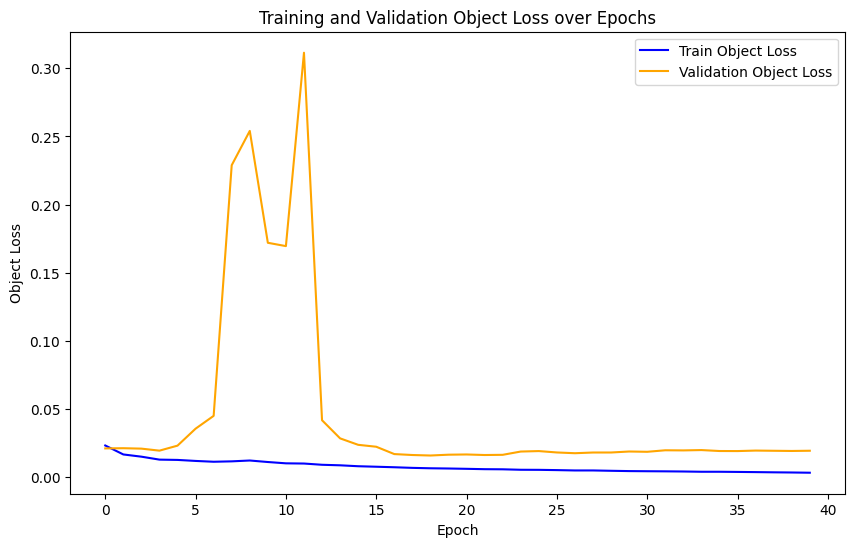

In [68]:
# !pip install matplotlib

import pandas as pd
import matplotlib.pyplot as plt

results_path = '/kaggle/working/yolov5/runs/train/custom_badger_detection_fold1_0/results.csv'
df = pd.read_csv(results_path)

df.columns = df.columns.str.strip()

epochs = df['epoch']
train_box_loss = df['train/obj_loss']
val_box_loss = df['val/obj_loss']

plt.figure(figsize=(10, 6))
plt.plot(epochs, train_box_loss, label='Train Object Loss', color='blue')
plt.plot(epochs, val_box_loss, label='Validation Object Loss', color='orange')

plt.title('Training and Validation Object Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Object Loss')

plt.legend()
plt.show()

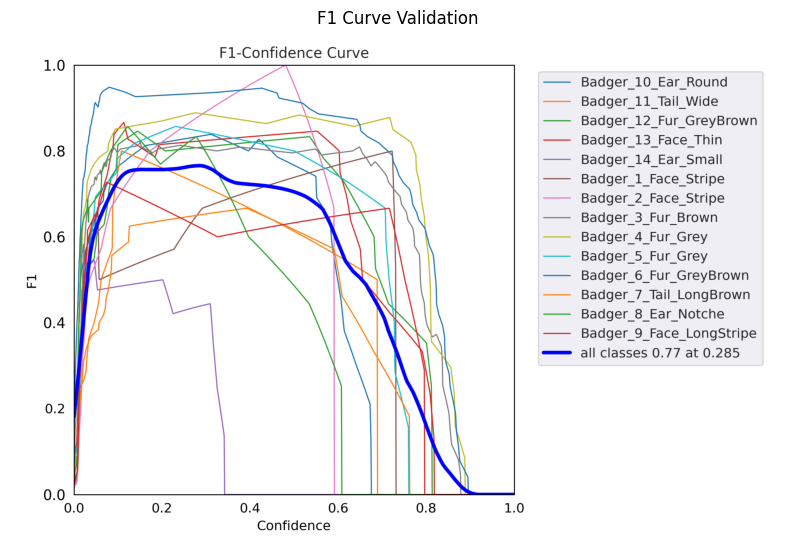

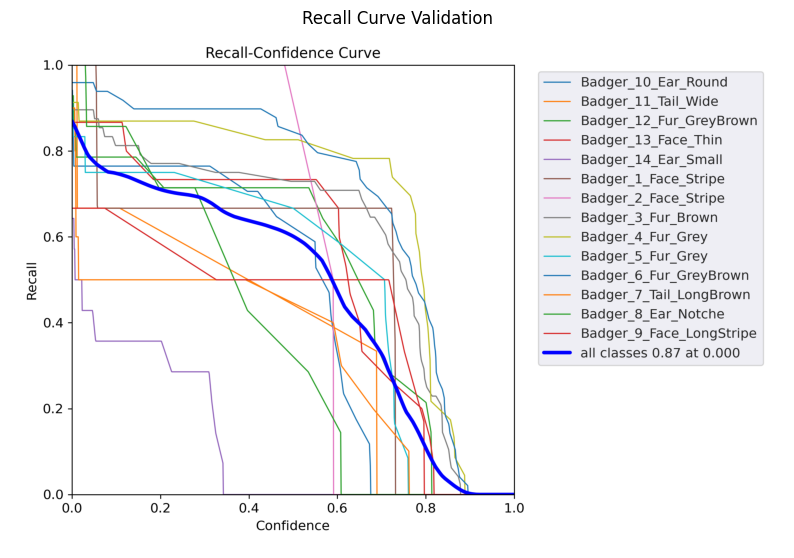

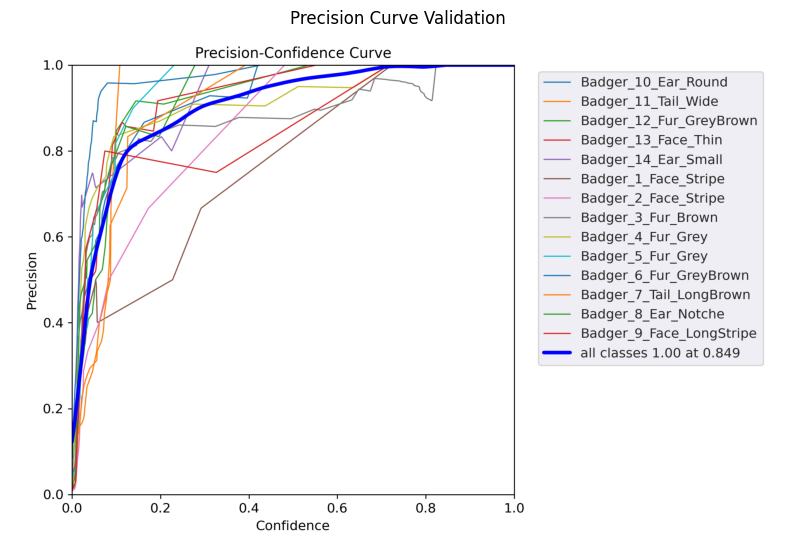

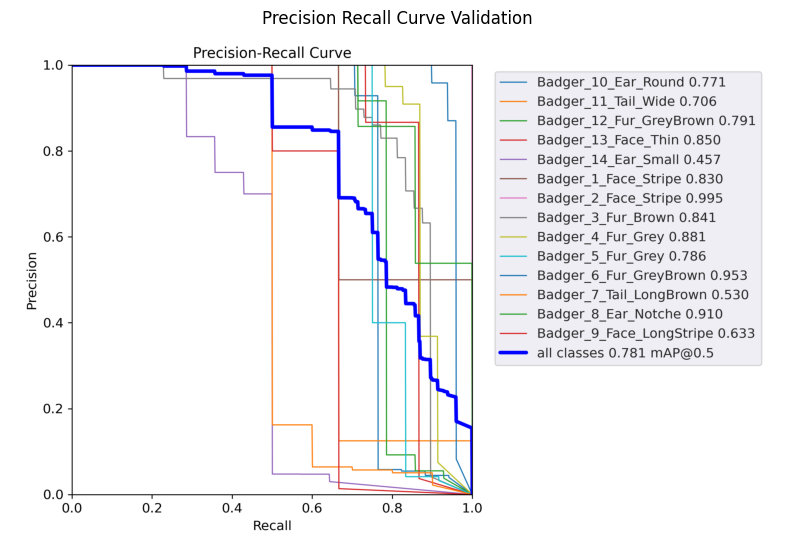

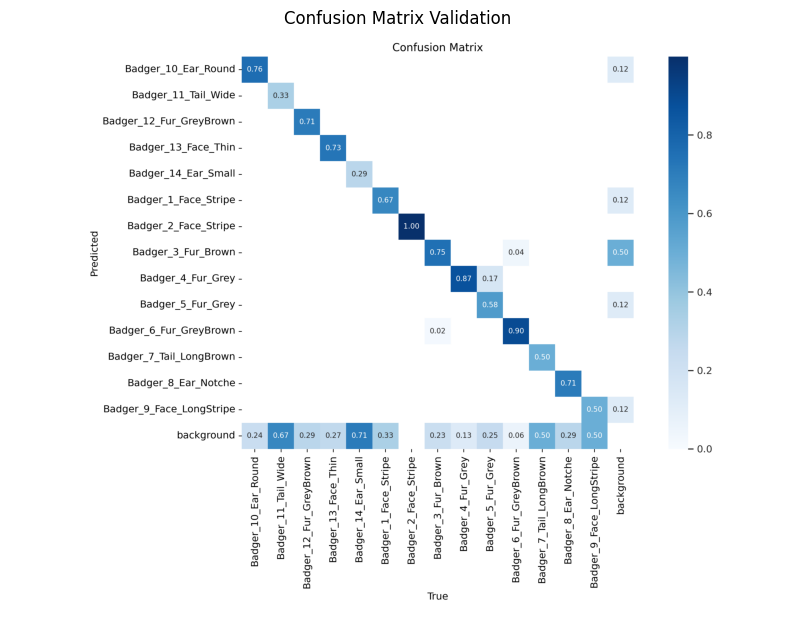

...

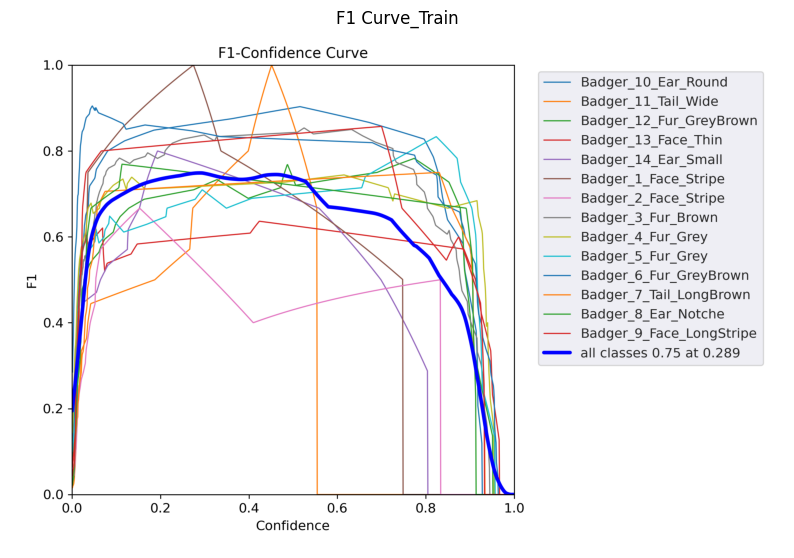

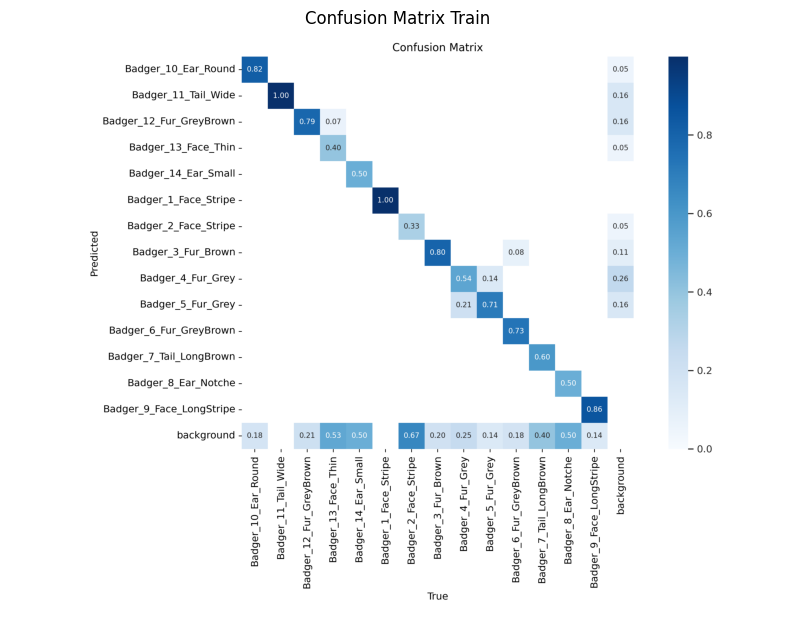

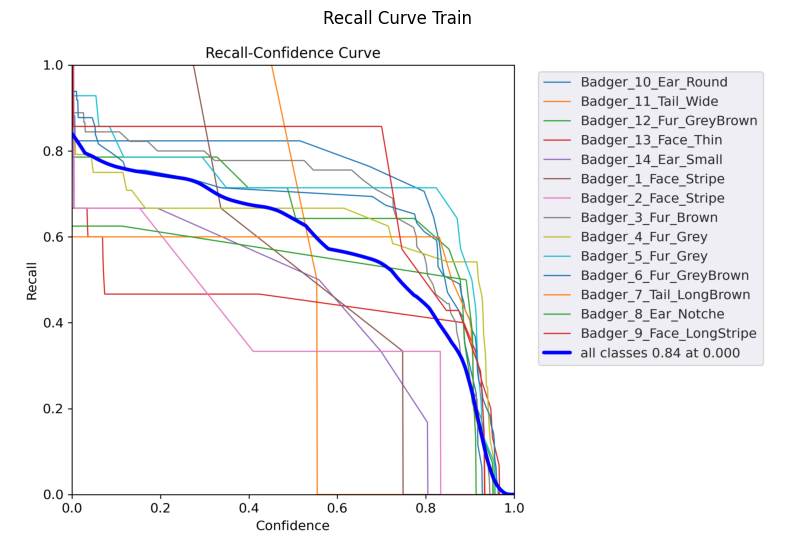

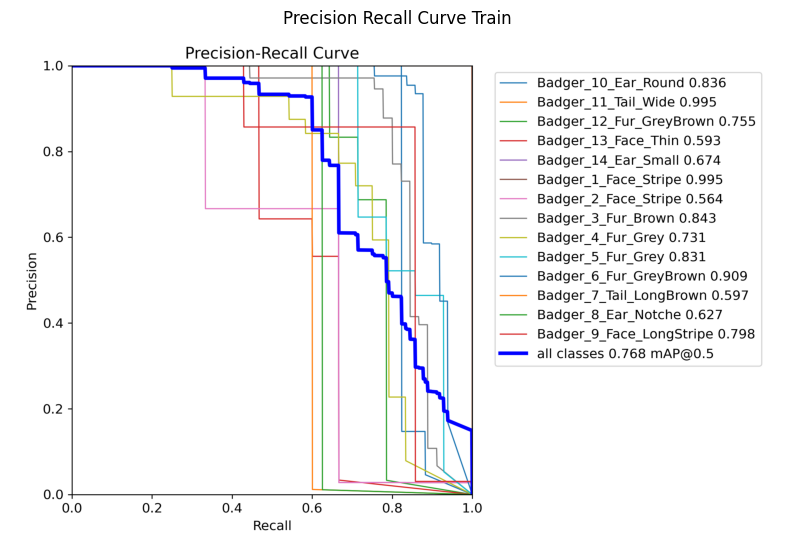

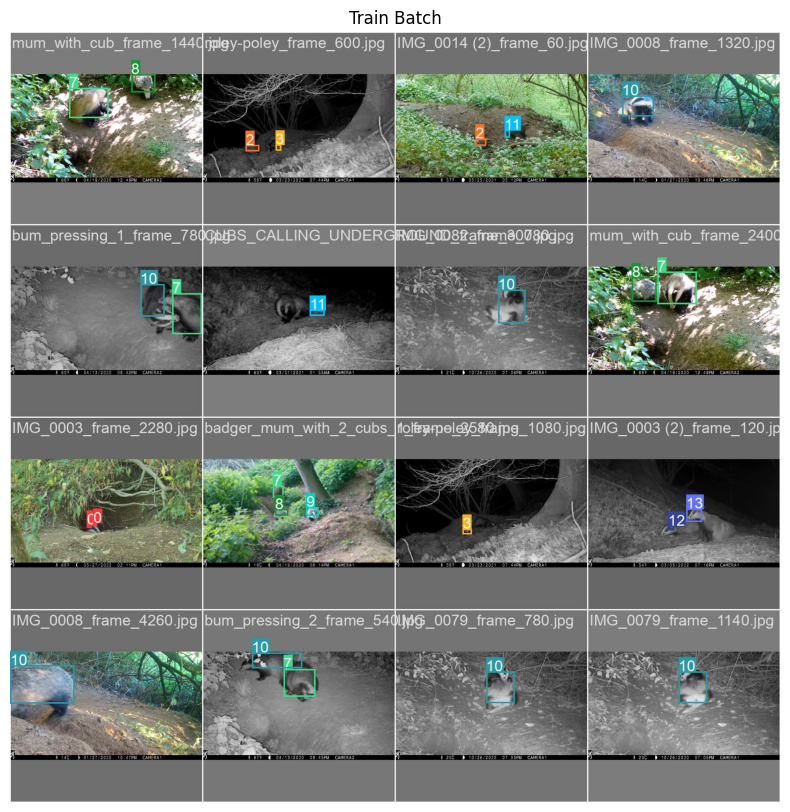

In [21]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Paths 
f1_curve_path = '/kaggle/working/yolov5/runs/val/exp/F1_curve.png'
r_curve_path = '/kaggle/working/yolov5/runs/val/exp/R_curve.png'
p_curve_path = '/kaggle/working/yolov5/runs/val/exp/P_curve.png'
pr_curve_path = '/kaggle/working/yolov5/runs/val/exp/PR_curve.png'
confusion_matrix = '/kaggle/working/yolov5/runs/val/exp/confusion_matrix.png'
val_pred = '/kaggle/working/yolov5/runs/val/exp/val_batch2_pred.jpg'

results_image_path = '/kaggle/working/yolov5/runs/train/custom_badger_detection_fold1_0/results.png'
f1_curve_path_train = '/kaggle/working/yolov5/runs/train/custom_badger_detection_fold1_0/F1_curve.png'
confusion_matrix_train = '/kaggle/working/yolov5/runs/train/custom_badger_detection_fold1_0/confusion_matrix.png'
r_curve_path_train = '/kaggle/working/yolov5/runs/train/custom_badger_detection_fold1_0/R_curve.png'
pr_curve_path_train = '/kaggle/working/yolov5/runs/train/custom_badger_detection_fold1_0/PR_curve.png'
train_batch = '/kaggle/working/yolov5/runs/train/custom_badger_detection_fold1_0/train_batch2.jpg'


#display images
def display_image(image_path, title):
    img = mpimg.imread(image_path)
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
    plt.show()

# Display the images
#  For validation set
display_image(f1_curve_path, 'F1 Curve Validation')
display_image(r_curve_path, 'Recall Curve Validation')
display_image(p_curve_path, 'Precision Curve Validation')
display_image(pr_curve_path, 'Precision Recall Curve Validation')
display_image(confusion_matrix, 'Confusion Matrix Validation')
display_image(val_pred, 'Validation_Prediction Validation')

#  For training set
display_image(results_image_path, 'Training Results')
display_image(f1_curve_path_train , 'F1 Curve_Train')
display_image(confusion_matrix_train, 'Confusion Matrix Train')
display_image(r_curve_path_train, 'Recall Curve Train')
display_image(pr_curve_path_train, 'Precision Recall Curve Train')
display_image(train_batch, 'Train Batch')

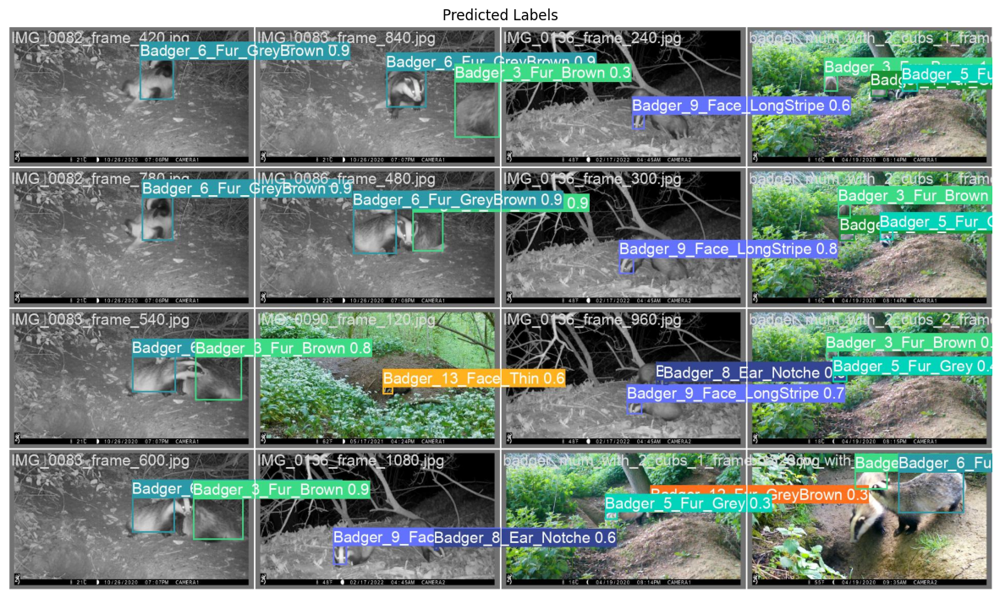

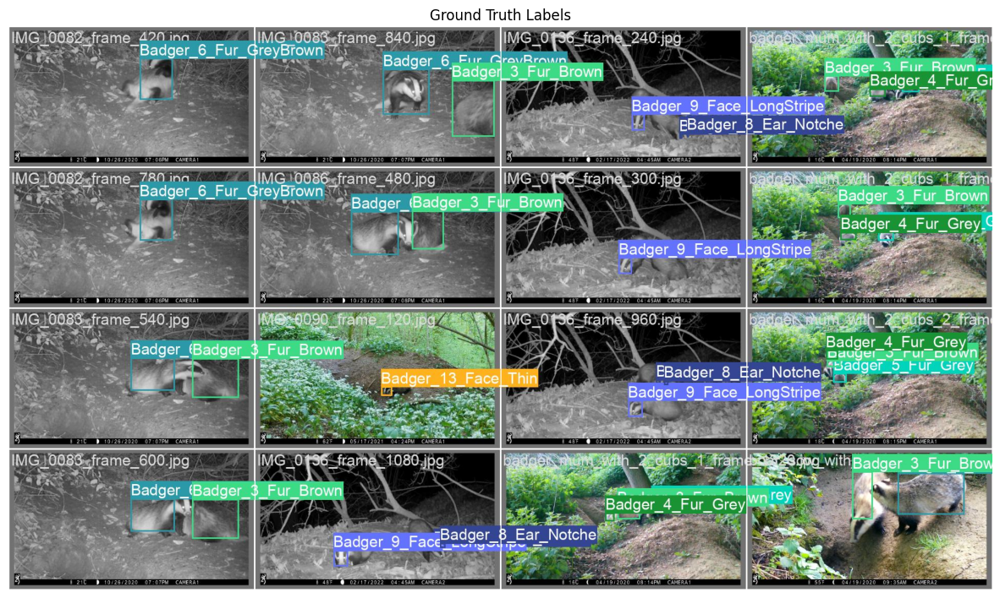

In [72]:

#  This is for validation set

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Paths to the images
pred_image_path = '/kaggle/working/yolov5/runs/val/exp4/val_batch2_pred.jpg'
label_image_path = '/kaggle/working/yolov5/runs/val/exp4/val_batch2_labels.jpg'

# display images
def display_image(image_path, title):
    img = mpimg.imread(image_path)
    plt.figure(figsize=(15, 12))
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
    plt.show()

# Display the images
display_image(pred_image_path, 'Predicted Labels')
display_image(label_image_path, 'Ground Truth Labels')

In [73]:

#  This is for the test the models, I have splitted the data into train, val, test sets

import subprocess
import shutil
import os

# Paths
new_images_path = '/kaggle/working/fold_1/images/test'
model_weights_path = '/kaggle/working/yolov5/runs/train/custom_badger_detection_fold1_0/weights/best.pt'
output_folder = 'runs/detect/exp'

# Run detection with --save-txt flag
detect_command = f'python detect.py --weights "{model_weights_path}" --img 640 --conf 0.25 --source "{new_images_path}" --save-txt'
result = subprocess.run(detect_command, shell=True, capture_output=True, text=True)

# Check for errors
if result.returncode == 0:
    print("Detection completed successfully. Check the runs/detect/exp folder for outputs.")
else:
    print("Detection failed. Error output:")
    print(result.stderr)

import numpy as np
import os
import xml.etree.ElementTree as ET
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# read YOLO format predictions
def read_yolo_predictions(predictions_folder):
    predictions = {}
    for filename in os.listdir(predictions_folder):
        if filename.endswith(".txt"):
            image_id = os.path.splitext(filename)[0]
            with open(os.path.join(predictions_folder, filename)) as f:
                bboxes = []
                for line in f:
                    parts = line.strip().split()
                    class_id = int(parts[0])
                    score = float(parts[-1])  #  confidence score
                    bbox = list(map(float, parts[1:-1]))
                    bboxes.append((class_id, bbox, score))
                predictions[image_id] = bboxes
    return predictions

# ground truth annotations
def read_ground_truth_annotations(annotations_folder):
    ground_truths = {}
    for filename in os.listdir(annotations_folder):
        if filename.endswith(".xml"):
            image_id = os.path.splitext(filename)[0]
            tree = ET.parse(os.path.join(annotations_folder, filename))
            root = tree.getroot()
            bboxes = []
            for obj in root.iter('object'):
                class_name = obj.find('name').text
                class_id = class_to_idx[class_name]
                xmlbox = obj.find('bndbox')
                bbox = [
                    int(xmlbox.find('xmin').text),
                    int(xmlbox.find('ymin').text),
                    int(xmlbox.find('xmax').text),
                    int(xmlbox.find('ymax').text)
                ]
                bboxes.append((class_id, bbox))
            ground_truths[image_id] = bboxes
    return ground_truths

Detection completed successfully. Check the runs/detect/exp folder for outputs.


In [74]:
# Evalute on test , and accuracy score


import numpy as np
import os
import xml.etree.ElementTree as ET
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Paths
output_folder = '/kaggle/working/yolov5/runs/detect/exp/labels' 
ground_truth_path = '/kaggle/working/fold_1/labels/test'

# read YOLO format predictions
def read_yolo_predictions(predictions_folder):
    predictions = {}
    for filename in os.listdir(predictions_folder):
        if filename.endswith(".txt"):
            image_id = os.path.splitext(filename)[0]
            with open(os.path.join(predictions_folder, filename)) as f:
                bboxes = []
                for line in f:
                    parts = line.strip().split()
                    class_id = int(parts[0])
#                     confidence score
                    score = float(parts[-1])  
                    bbox = list(map(float, parts[1:-1]))
                    bboxes.append((class_id, bbox, score))
                predictions[image_id] = bboxes
    return predictions

# Read ground truth annotations
def read_ground_truth_annotations(annotations_folder):
    ground_truths = {}
    for filename in os.listdir(annotations_folder):
        if filename.endswith(".xml"):
            image_id = os.path.splitext(filename)[0]
            tree = ET.parse(os.path.join(annotations_folder, filename))
            root = tree.getroot()
            bboxes = []
            for obj in root.iter('object'):
                class_name = obj.find('name').text
                class_id = class_to_idx[class_name]
                xmlbox = obj.find('bndbox')
                bbox = [
                    int(xmlbox.find('xmin').text),
                    int(xmlbox.find('ymin').text),
                    int(xmlbox.find('xmax').text),
                    int(xmlbox.find('ymax').text)
                ]
                bboxes.append((class_id, bbox))
            ground_truths[image_id] = bboxes
    return ground_truths

# Map class names to indices
with open('/kaggle/working/classes.txt') as f:
    classes = [line.strip() for line in f.readlines()]
class_to_idx = {cls: idx for idx, cls in enumerate(classes)}

#predictions and ground truth annotations
predictions = read_yolo_predictions(output_folder)
ground_truths = read_ground_truth_annotations(ground_truth_path)

# confidence threshold and evaluate metrics
def evaluate_at_different_thresholds(predictions, ground_truths, thresholds):
    y_true = []
    y_scores = []

    for image_id in ground_truths.keys():
        gt_labels = [class_id for class_id, _ in ground_truths[image_id]]
        if image_id in predictions:
            pred_labels_scores = [(class_id, score) for class_id, bbox, score in predictions[image_id]]
            for class_id, score in pred_labels_scores:
                y_true.append(1 if class_id in gt_labels else 0)
                y_scores.append(score)
        else:
            for class_id in gt_labels:
                y_true.append(0)
                y_scores.append(0.0)

    y_true = np.array(y_true)
    y_scores = np.array(y_scores)

    for threshold in thresholds:
        y_pred = y_scores >= threshold
        precision = precision_score(y_true, y_pred)
        recall = recall_score(y_true, y_pred)
        f1 = f1_score(y_true, y_pred)
        accuracy = accuracy_score(y_true, y_pred)
        print(f"Threshold: {threshold}")
        print(f"Precision: {precision:.2f}")
        print(f"Recall: {recall:.2f}")
        print(f"F1-Score: {f1:.2f}")
        print(f"Accuracy: {accuracy:.2f}")
        print()

# thresholds
thresholds = [0.05]
evaluate_at_different_thresholds(predictions, ground_truths, thresholds)

Threshold: 0.05
Precision: 1.00
Recall: 0.89
F1-Score: 0.94
Accuracy: 0.89



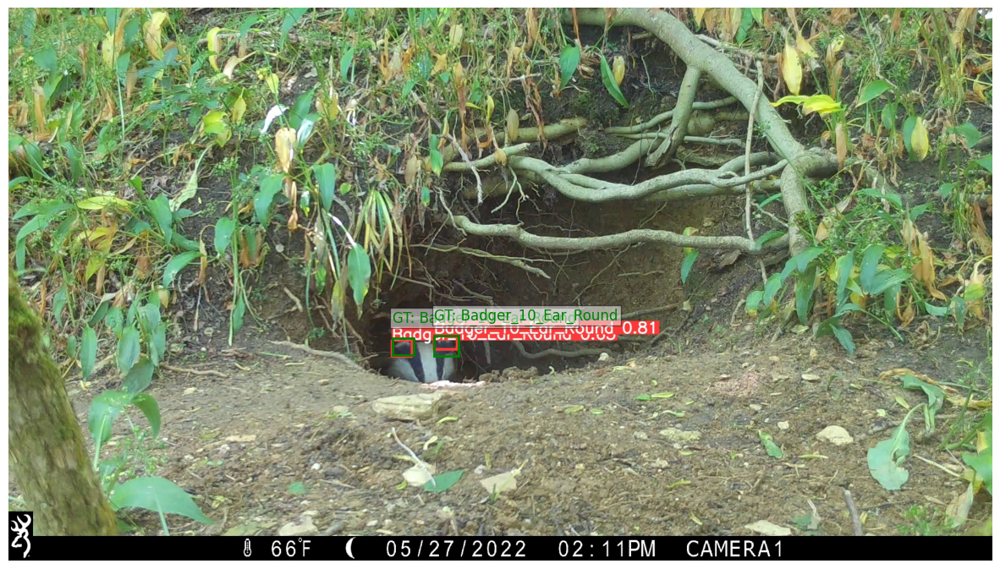

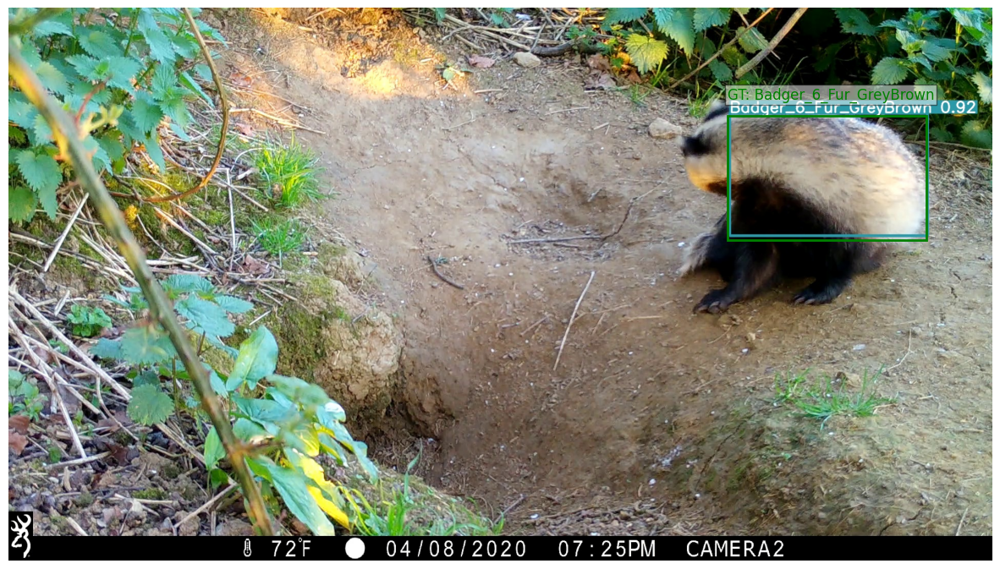

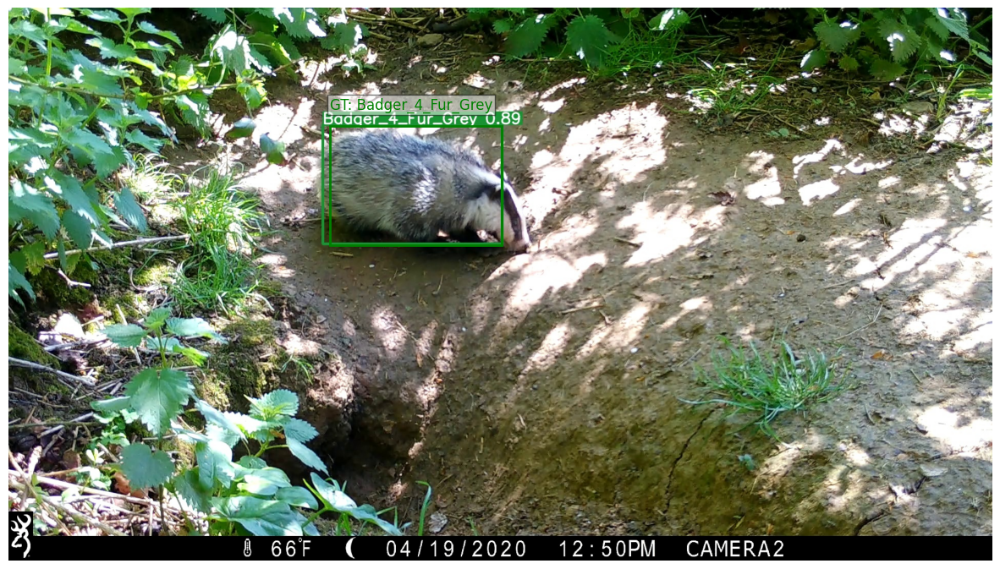

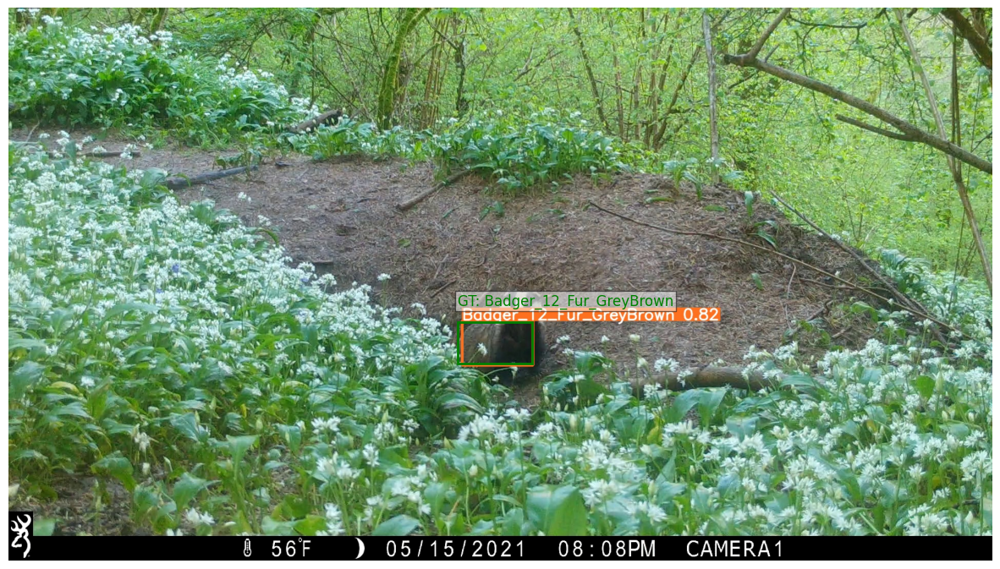

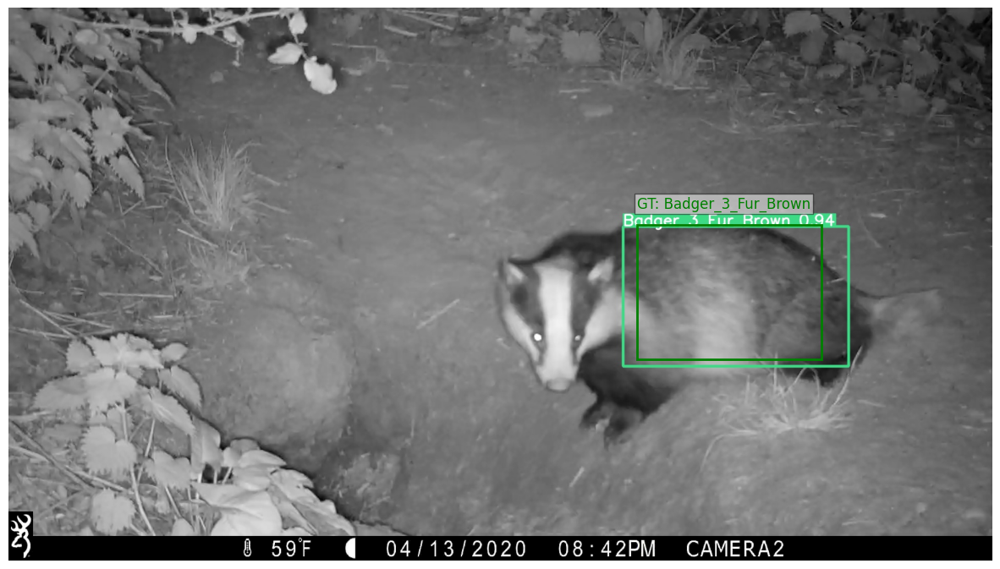

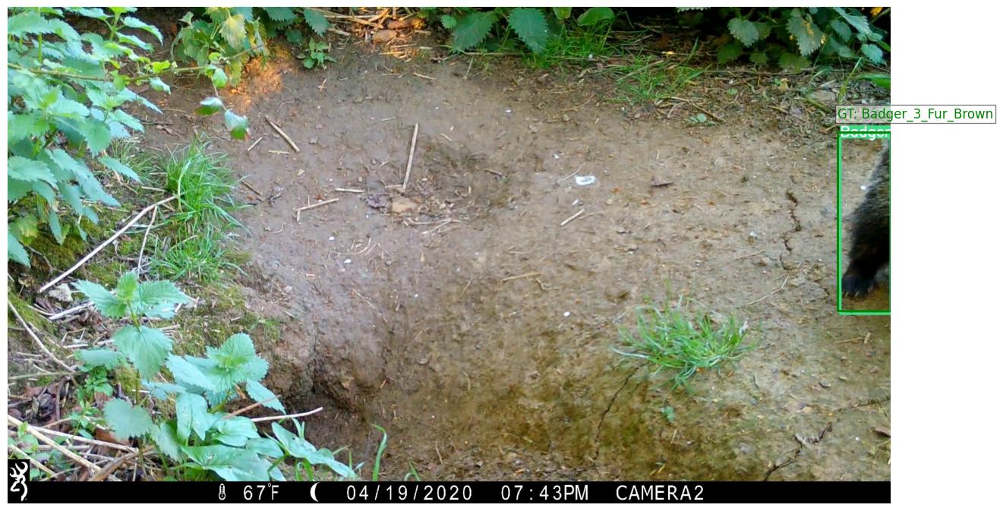

In [75]:
# Evaluate the model based on test set


import os
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import xml.etree.ElementTree as ET

# Paths, 
images_path = '/kaggle/working/yolov5/runs/detect/exp'
labels_path = '/kaggle/working/yolov5/runs/detect/exp/labels'
ground_truth_path = '/kaggle/working/fold_1/labels/test'

# load and display images with bounding boxes
def display_image_with_boxes(image_path, pred_label_path, gt_label_path):
    # Load image
    image = Image.open(image_path)
    # Create figure and axes
    fig, ax = plt.subplots(1, figsize=(15, 10))
    ax.imshow(image)
    
    # Read predicted bounding box information
    with open(pred_label_path, 'r') as f:
        lines = f.readlines()
        for line in f:
            parts = line.strip().split()
            if len(parts) < 5:
                continue
            class_id = int(parts[0])
            bbox = list(map(float, parts[1:]))
            x_center, y_center, width, height = bbox
            x_min = x_center - width / 2
            y_min = y_center - height / 2
            
            # Rectangle patch for predictions
            rect = patches.Rectangle((x_min * image.width, y_min * image.height), width * image.width, height * image.height, linewidth=2, edgecolor='r', facecolor='none', linestyle='dashed')
            
            # Add the patch to the Axes
            ax.add_patch(rect)
            ax.text(x_min * image.width, y_min * image.height - 10, f"Pred: {class_id}", color='red', fontsize=12, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5, pad=2))
    
    # Read ground truth bounding box information
    tree = ET.parse(gt_label_path)
    root = tree.getroot()
    for obj in root.iter('object'):
        class_name = obj.find('name').text
        xmlbox = obj.find('bndbox')
        x_min = int(xmlbox.find('xmin').text) / image.width
        y_min = int(xmlbox.find('ymin').text) / image.height
        x_max = int(xmlbox.find('xmax').text) / image.width
        y_max = int(xmlbox.find('ymax').text) / image.height
        
        # Create a Rectangle patch for ground truths
        rect = patches.Rectangle((x_min * image.width, y_min * image.height), (x_max - x_min) * image.width, (y_max - y_min) * image.height, linewidth=2, edgecolor='g', facecolor='none')
        
        # Add the patch to the Axes
        ax.add_patch(rect)
        ax.text(x_min * image.width, y_min * image.height - 25, f"GT: {class_name}", color='green', fontsize=12, verticalalignment='bottom', bbox=dict(facecolor='white', alpha=0.5, pad=2))
    
    plt.axis('off')
    plt.show()

# Get list of all images and corresponding label files
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]
pred_label_files = [f.replace('.jpg', '.txt') for f in image_files]
gt_label_files = [f.replace('.jpg', '.xml') for f in image_files]

# Select 7 random images
random_indices = random.sample(range(len(image_files)), 6)

# Display the images with their bounding boxes
for idx in random_indices:
    image_file = image_files[idx]
    pred_label_file = pred_label_files[idx]
    gt_label_file = gt_label_files[idx]
    
    display_image_with_boxes(os.path.join(images_path, image_file), os.path.join(labels_path, pred_label_file), os.path.join(ground_truth_path, gt_label_file))


Threshold: 0.05
Precision: 1.00
Recall: 0.89
F1-Score: 0.94
Accuracy: 0.89



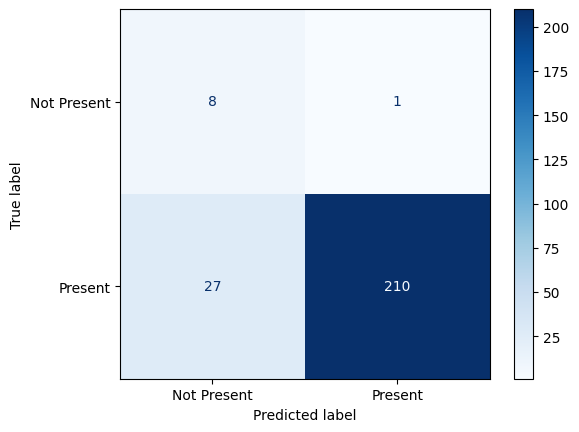

In [76]:
# Evaluate on test test


# Map class names to indices
with open('/kaggle/working/classes.txt') as f:
    classes = [line.strip() for line in f.readlines()]
class_to_idx = {cls: idx for idx, cls in enumerate(classes)}

# predictions and ground truth annotations
predictions = read_yolo_predictions(output_folder)
ground_truths = read_ground_truth_annotations(ground_truth_path)

# confidence threshold and evaluate metrics
def evaluate_at_different_thresholds(predictions, ground_truths, thresholds):
    y_true = []
    y_scores = []

    for image_id in ground_truths.keys():
        gt_labels = [class_id for class_id, _ in ground_truths[image_id]]
        if image_id in predictions:
            pred_labels_scores = [(class_id, score) for class_id, bbox, score in predictions[image_id]]
            for class_id, score in pred_labels_scores:
                y_true.append(1 if class_id in gt_labels else 0)
                y_scores.append(score)
        else:
            for class_id in gt_labels:
                y_true.append(0)
                y_scores.append(0.0)

    y_true = np.array(y_true)
    y_scores = np.array(y_scores)

    for threshold in thresholds:
        y_pred = y_scores >= threshold
        precision = precision_score(y_true, y_pred)
        recall = recall_score(y_true, y_pred)
        f1 = f1_score(y_true, y_pred)
        accuracy = accuracy_score(y_true, y_pred)
        cm = confusion_matrix(y_true, y_pred)

        print(f"Threshold: {threshold}")
        print(f"Precision: {precision:.2f}")
        print(f"Recall: {recall:.2f}")
        print(f"F1-Score: {f1:.2f}")
        print(f"Accuracy: {accuracy:.2f}")
        print()

        # Plot confusion matrix
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not Present', 'Present'])
        disp.plot(cmap=plt.cm.Blues)
        plt.show()

# thresholds
thresholds = [0.05]
evaluate_at_different_thresholds(predictions, ground_truths, thresholds)